# Chapter 6 - R Exercises

In [1]:
library(tidyverse)
library(bayesrules)
library(bayesplot)
library(rstan)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.2     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
This is bayesplot version 1.10.0

- Online documentation and vignettes at mc-stan.org/bayesplot

- bayesplot theme set to bayesplot::theme_default()

   * Does _not_ affect other ggplot2 plots

   * See ?bayesplot_theme_set for details on theme setting

Loading required package: StanHeaders

rstan (Version 2.21.8, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recomp

## Exercise 6.5

### a)

In [2]:
# create grid
grid_data <- data.frame( pi_grid = c(0,0.25,0.5,0.75,1) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dbeta(x=pi_grid, shape1=3, shape2=8),
        likelihood=dbinom(x=2, size=10, prob=pi_grid) 
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

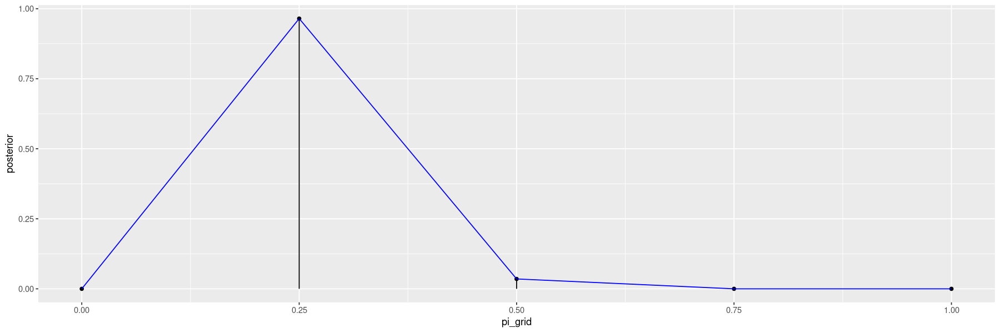

In [3]:
options(repr.plot.width=15, repr.plot.height=5)
ggplot( grid_data, aes(x=pi_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = pi_grid, xend = pi_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution (Beta(5,16)):

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


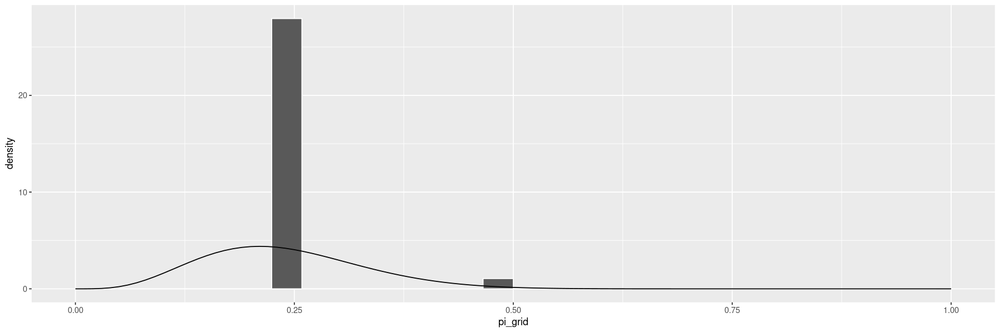

In [4]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = pi_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dbeta, args = list(5, 16) ) + 
  lims( x = c(0, 1) )

### b)

In [5]:
# create grid
grid_data <- data.frame( pi_grid = seq(from = 0, to = 1, length = 201) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dbeta(x=pi_grid, shape1=3, shape2=8),
        likelihood=dbinom(x=2, size=10, prob=pi_grid) 
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

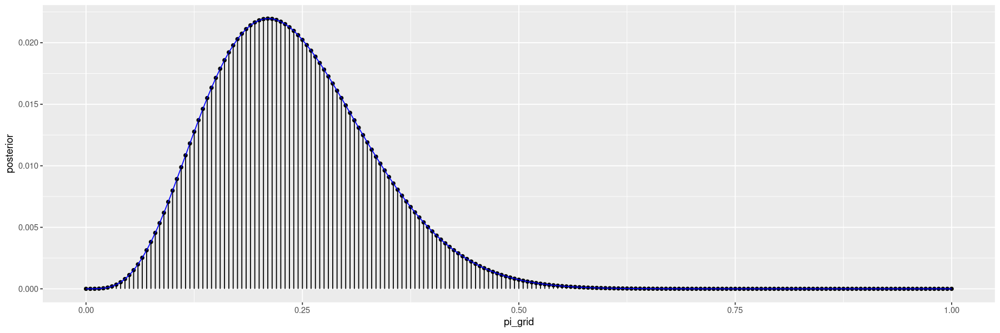

In [6]:
ggplot( grid_data, aes(x=pi_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = pi_grid, xend = pi_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution (Beta(5,16)):

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


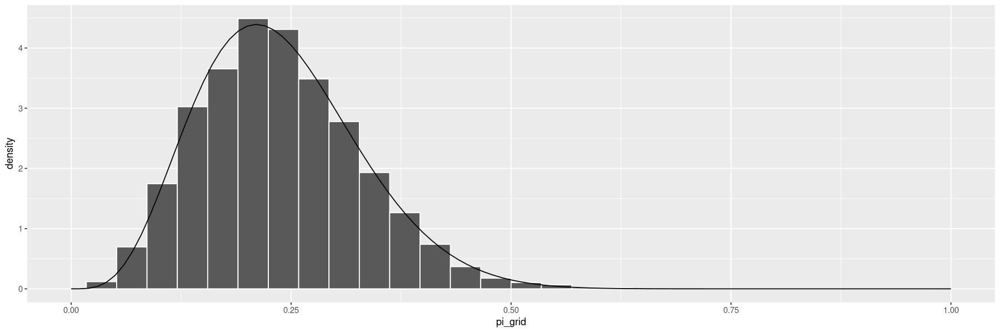

In [7]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = pi_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dbeta, args = list(5, 16) ) + 
  lims( x = c(0, 1) )

## Exercise 6.6

### a)

In [8]:
# create grid
grid_data <- data.frame( lambda_grid = seq(from = 0, to = 8, length = 9) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dgamma(lambda_grid, 20, 5),
        likelihood=dpois(0, lambda=lambda_grid) * dpois(1, lambda=lambda_grid) * dpois(0, lambda=lambda_grid)
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

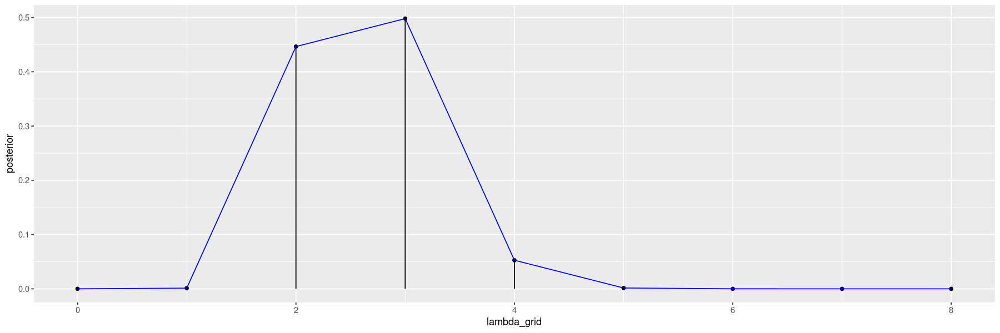

In [9]:
ggplot( grid_data, aes(x=lambda_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = lambda_grid, xend = lambda_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution (Gamma(6,19)):

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


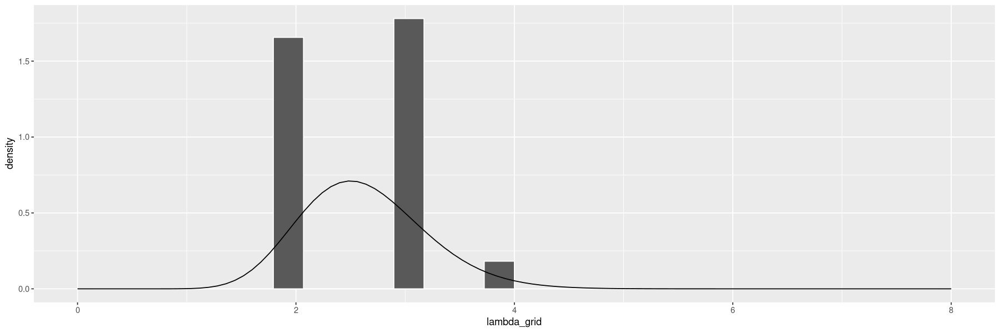

In [10]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = lambda_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dgamma, args = list(21, 8) ) + 
  lims( x = c(0, 8) )

### b)

In [11]:
# create grid
grid_data <- data.frame( lambda_grid = seq(from = 0, to = 8, length = 201) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dgamma(lambda_grid, 20, 5),
        likelihood=dpois(0, lambda=lambda_grid) * dpois(1, lambda=lambda_grid) * dpois(0, lambda=lambda_grid)
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

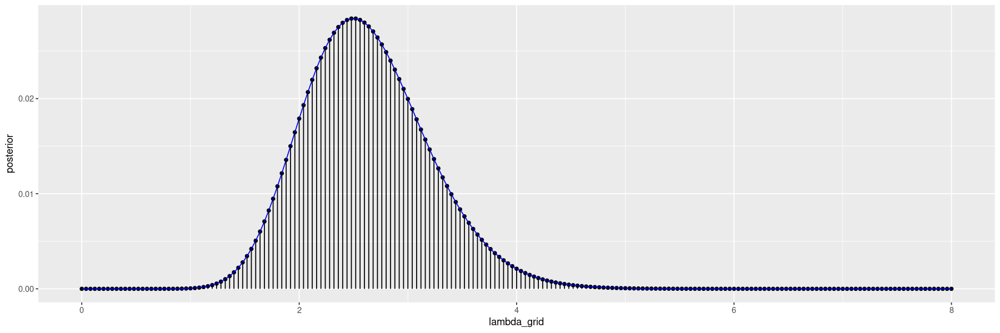

In [12]:
ggplot( grid_data, aes(x=lambda_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = lambda_grid, xend = lambda_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution (Gamma(6,19)):

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


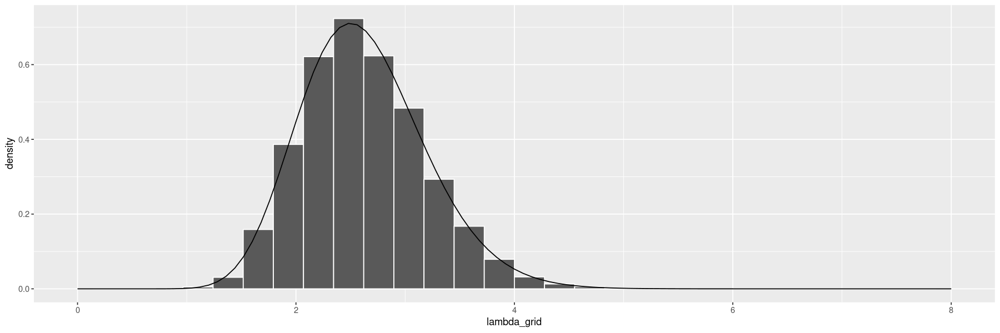

In [13]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = lambda_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dgamma, args = list(21,8) ) + 
  lims( x = c(0, 8) )

## Exercise 6.7

### a)

In [14]:
# create grid
grid_data <- data.frame( mu_grid = seq(from = 5, to = 15, length = 11) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dnorm(mu_grid, 10, 1.2),
        likelihood=dnorm(7.1, mu_grid, 1.3) * dnorm(8.9, mu_grid, 1.3) * dnorm(8.4, mu_grid, 1.3) * dnorm(8.6, mu_grid, 1.3)
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

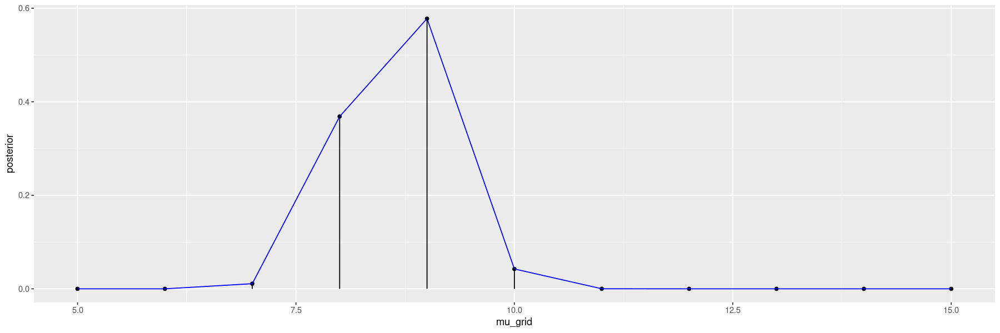

In [15]:
ggplot( grid_data, aes(x=mu_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = mu_grid, xend = mu_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution:

$$
N\left(\theta \frac{\sigma^2}{n\tau^2 + \sigma^2} + \bar{y} \frac{n\tau^2}{n\tau^2 + \sigma^2}, \frac{\tau^2\sigma^2}{n\tau^2 + \sigma^2}\right)
$$

In [16]:
theta <- 10
tau <- 1.2
sigma <- 1.3
n <- 4
ybar <- mean( c(7.1, 8.9, 8.4, 8.6) )
theta2 <- theta * sigma^2/(n*tau^2+sigma^2) + ybar * n*tau^2/(n*tau^2 + sigma^2)
tau2 <- sqrt( tau^2 * sigma^2 / (n*tau^2 + sigma^2) )
print(paste0(c("theta' = ", theta2, ", tau' = ", tau2), collapse = ''))

[1] "theta' = 8.64697986577181, tau' = 0.571539778248903"


(or alternatively use `summarize_normal_normal()`)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


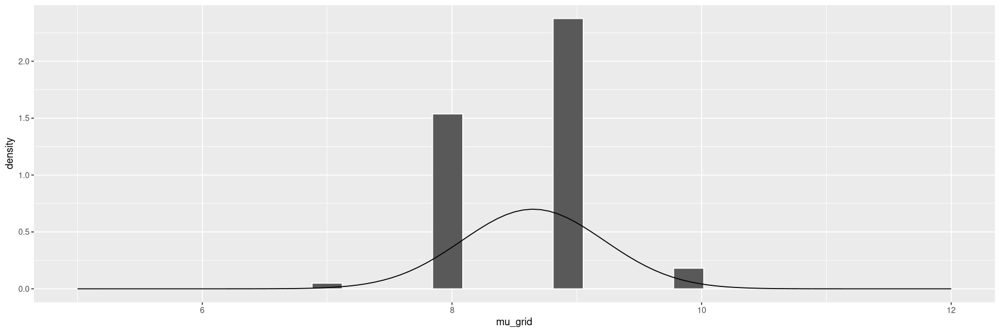

In [17]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = mu_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dnorm, args = list(8.65,0.57) ) + 
  lims( x = c(5, 12) )

### b)

In [18]:
# create grid
grid_data <- data.frame( mu_grid = seq(from = 5, to = 15, length = 201) )

# approximate posterior
grid_data <- grid_data %>% 
    mutate( 
        prior=dnorm(mu_grid, 10, 1.2),
        likelihood=dnorm(7.1, mu_grid, 1.3) * dnorm(8.9, mu_grid, 1.3) * dnorm(8.4, mu_grid, 1.3) * dnorm(8.6, mu_grid, 1.3)
    ) %>% 
    mutate( unnormalized_posterior=prior*likelihood ) %>% 
    mutate( posterior=unnormalized_posterior/sum(unnormalized_posterior) )

Plot of approximated posterior density:

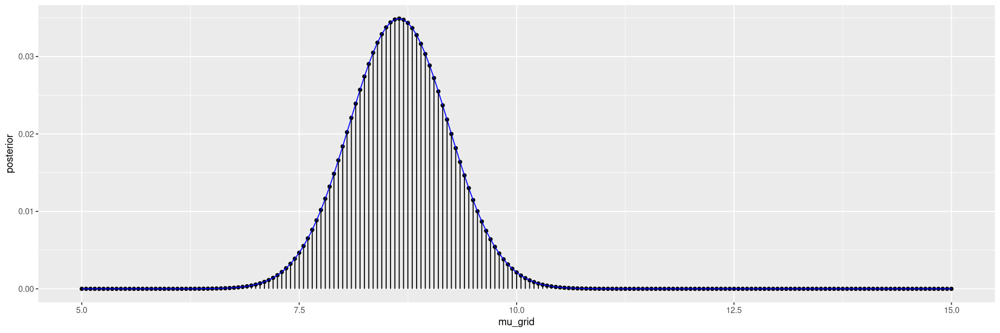

In [19]:
ggplot( grid_data, aes(x=mu_grid, y=posterior) ) + 
    geom_point() +
    geom_line( col="blue" ) + 
    geom_segment( aes(x = mu_grid, xend = mu_grid, y = 0, yend = posterior) )

Compare with actual posterior distribution:

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message:
“Removed 2 rows containing missing values (`geom_bar()`).”


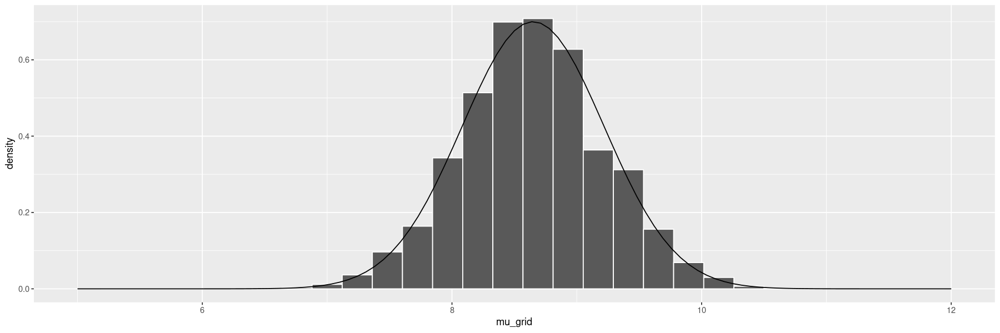

In [20]:
posterior_sample <- grid_data %>% 
    sample_n( 10000, replace=TRUE, weight=posterior )

ggplot( posterior_sample, aes(x = mu_grid) ) + 
  geom_histogram( aes(y = ..density..), color = "white") + 
  stat_function( fun = dnorm, args = list(8.65,0.57) ) + 
  lims( x = c(5, 12) )

## Exercise 6.11

If necessary, the length of $Y$ is specified with the number of values needed in Exercise 6.12.

### a)

$Y|\pi \sim \text{Bin}(20,\pi), \pi \sim \text{Beta}(1,1)$

In [21]:
bb_model <- "
    data {
        int<lower=0, upper=20> Y;
    }
    parameters {
        real<lower=0, upper=1> pi;
    }
    model {
        Y ~ binomial(20, pi);
        pi ~ beta(1, 1);
    }
"

### b)

$Y|\lambda \sim \text{Pois}(\lambda), \lambda \sim \text{Gamma}(4,2)$

In [22]:
gp_model <- "
    data {
        int<lower=0> Y;
    }
    parameters {
        real<lower=0> lambda;
    }
    model {
        Y ~ poisson(lambda);
        lambda ~ gamma(4,2);
    }
"

### c)

$Y|\mu \sim N(\mu, 1^2), \mu \sim N(0, 10^2)$

In [23]:
nn_model <- "
    data {
        real Y;
    }
    parameters {
        real mu;
    }
    model {
        Y ~ normal(mu, 1);
        mu ~ normal(0, 10);
    }
"

## Exercise 6.12

### a)

In [24]:
bb_sim <- stan(model_code=bb_model, data=list(Y = 12), chains=4, iter=5000*2, seed=84735)


SAMPLING FOR MODEL 'fe76e541088e990345f95e32e2af07ea' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 5e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.05 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.015201 seconds (Warm-up)
Chain 1:                0.015487 seconds 

### b)

In [25]:
gp_sim <- stan(model_code=gp_model, data=list(Y = 3), chains=4, iter=5000*2, seed=84735)


SAMPLING FOR MODEL '220217f262d29d739bf46053e20df11a' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 3e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.03 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.015576 seconds (Warm-up)
Chain 1:                0.015811 seconds 

### c)

In [26]:
nn_sim <- stan(model_code=nn_model, data=list(Y = 12.2), chains=4, iter=5000*2, seed=84735)


SAMPLING FOR MODEL '916dea906cba0d8e812452fbb4ccde78' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 3e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.03 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.012718 seconds (Warm-up)
Chain 1:                0.013205 seconds 

## Exercise 6.13

### a)

In [27]:
bb_model <- "
    data {
        int<lower=0, upper=10> Y;
    }
    parameters {
        real<lower=0, upper=1> pi;
    }
    model {
        Y ~ binomial(10, pi);
        pi ~ beta(3, 8);
    }
"

bb_sim <- stan(model_code=bb_model, data=list(Y = 2), chains=3, iter=12000, seed=84735)


SAMPLING FOR MODEL '223c1b3551c5830e46230f850b457b6b' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 5e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.05 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:     1 / 12000 [  0%]  (Warmup)
Chain 1: Iteration:  1200 / 12000 [ 10%]  (Warmup)
Chain 1: Iteration:  2400 / 12000 [ 20%]  (Warmup)
Chain 1: Iteration:  3600 / 12000 [ 30%]  (Warmup)
Chain 1: Iteration:  4800 / 12000 [ 40%]  (Warmup)
Chain 1: Iteration:  6000 / 12000 [ 50%]  (Warmup)
Chain 1: Iteration:  6001 / 12000 [ 50%]  (Sampling)
Chain 1: Iteration:  7200 / 12000 [ 60%]  (Sampling)
Chain 1: Iteration:  8400 / 12000 [ 70%]  (Sampling)
Chain 1: Iteration:  9600 / 12000 [ 80%]  (Sampling)
Chain 1: Iteration: 10800 / 12000 [ 90%]  (Sampling)
Chain 1: Iteration: 12000 / 12000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.017544 seconds (Warm-up)
Chain 1:                0.0190

Chain 1:

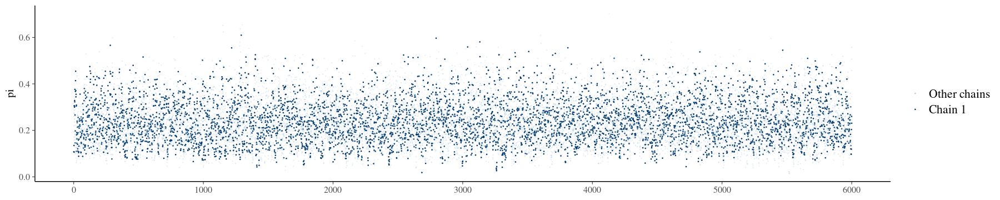

In [28]:
options(repr.plot.width=15, repr.plot.height=3)
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=1)

Chain 2:

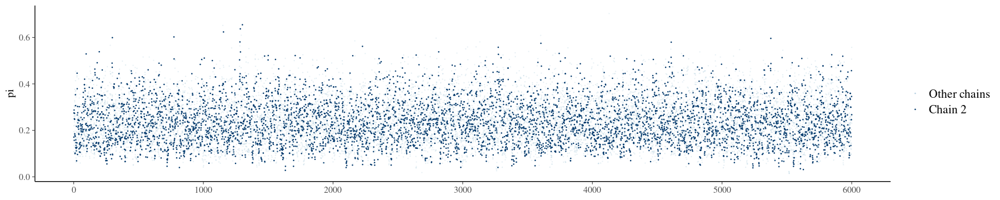

In [29]:
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=2)

Chain 3:

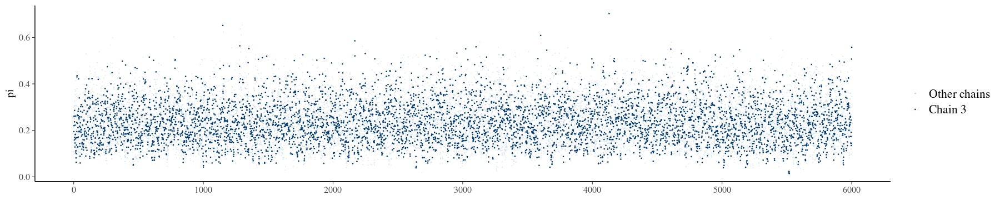

In [30]:
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=3)

Looks more or less like white noise!

### c)

By default, the first half of the samples are considered as burn-in and thrown away.

### d)

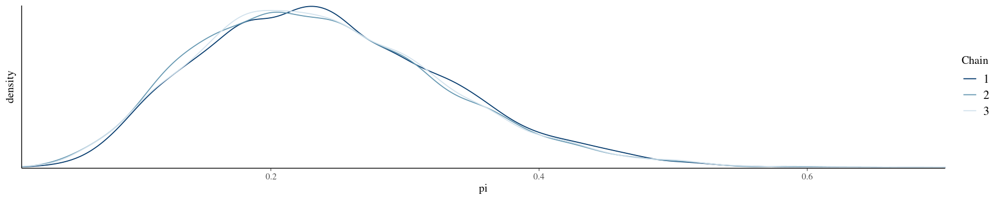

In [31]:
mcmc_dens_overlay(bb_sim, pars="pi") +
    ylab("density")

More or less in agreement!

### e)

Actual posterior model: 

$\text{Beta}(3,8) \to \text{Beta}(3 + y, 8 + n - y) = \text{Beta(5, 16)}$

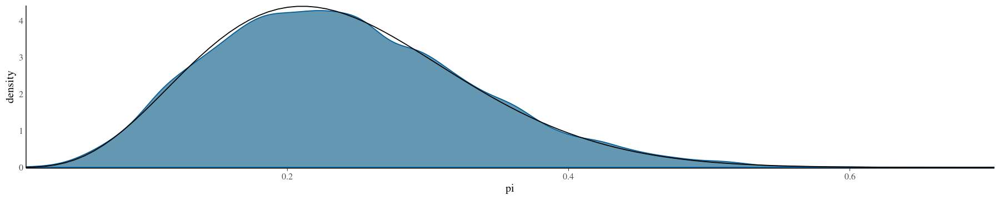

In [32]:
mcmc_dens( bb_sim, pars="pi" ) +
    stat_function( fun = dbeta, args = list(5, 16) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!

## Exercise 6.14

### a)

In [33]:
bb_model <- "
    data {
        int<lower=0, upper=12> Y;
    }
    parameters {
        real<lower=0, upper=1> pi;
    }
    model {
        Y ~ binomial(12, pi);
        pi ~ beta(4, 3);
    }
"

bb_sim <- stan(model_code=bb_model, data=list(Y = 4), chains=3, iter=12000, seed=84735)


SAMPLING FOR MODEL 'd1e3b461f0bfc614f2b1e4f3a224440d' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 8e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.08 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:     1 / 12000 [  0%]  (Warmup)
Chain 1: Iteration:  1200 / 12000 [ 10%]  (Warmup)
Chain 1: Iteration:  2400 / 12000 [ 20%]  (Warmup)
Chain 1: Iteration:  3600 / 12000 [ 30%]  (Warmup)
Chain 1: Iteration:  4800 / 12000 [ 40%]  (Warmup)
Chain 1: Iteration:  6000 / 12000 [ 50%]  (Warmup)
Chain 1: Iteration:  6001 / 12000 [ 50%]  (Sampling)
Chain 1: Iteration:  7200 / 12000 [ 60%]  (Sampling)
Chain 1: Iteration:  8400 / 12000 [ 70%]  (Sampling)
Chain 1: Iteration:  9600 / 12000 [ 80%]  (Sampling)
Chain 1: Iteration: 10800 / 12000 [ 90%]  (Sampling)
Chain 1: Iteration: 12000 / 12000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.017813 seconds (Warm-up)
Chain 1:                0.0188

Chain 1:

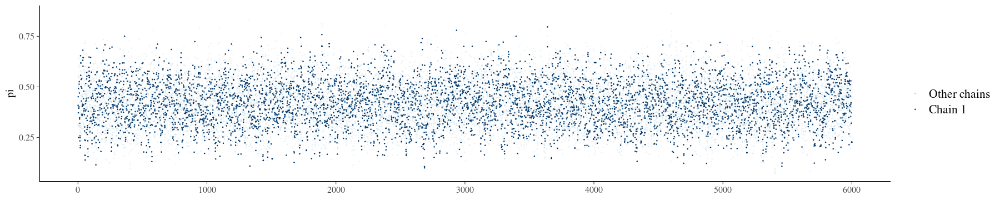

In [34]:
options(repr.plot.width=15, repr.plot.height=3)
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=1)

Chain 2:

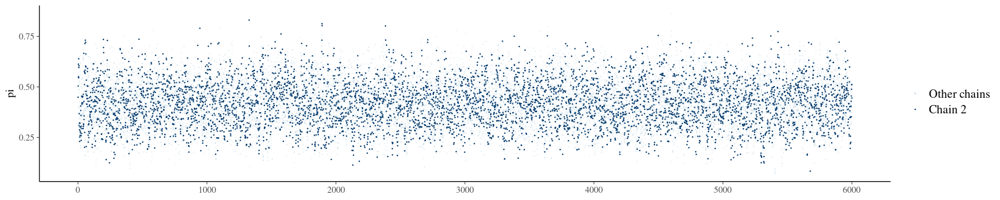

In [35]:
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=2)

Chain 3:

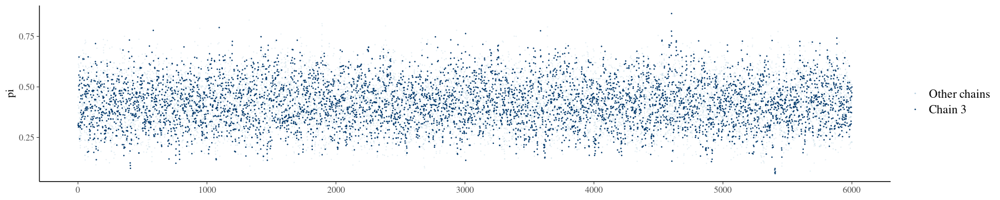

In [36]:
mcmc_trace_highlight(bb_sim, pars="pi", size=0.1, highlight=3)

Looks more or less like white noise!

### c)

By default, the first half of the samples are considered as burn-in and thrown away.

### d)

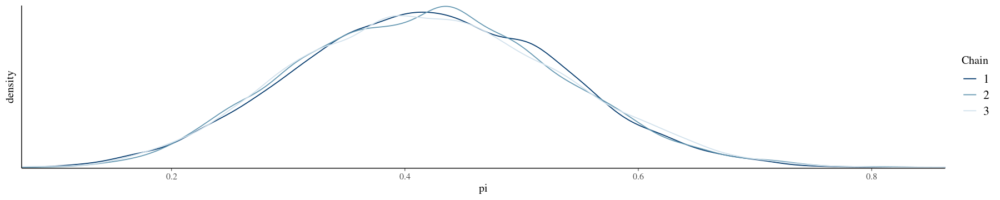

In [37]:
mcmc_dens_overlay(bb_sim, pars="pi") +
    ylab("density")

More or less in agreement!

### e)

Actual posterior model: 

$\text{Beta}(4,3) \to \text{Beta}(4 + y, 3 + n - y) = \text{Beta(8, 11)}$

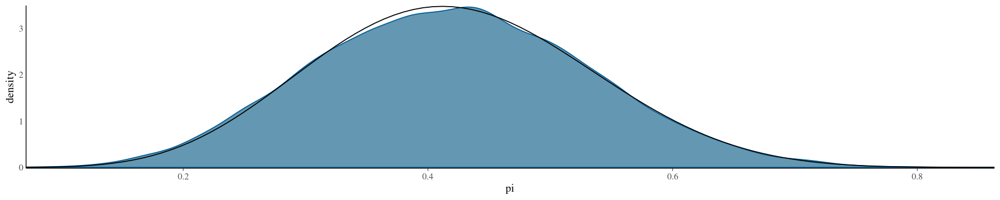

In [38]:
mcmc_dens( bb_sim, pars="pi" ) +
    stat_function( fun = dbeta, args = list(8, 11) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!

## Exercise 6.15

### a)

In [39]:
gp_model <- "
    data {
        int<lower=0> Y[3];
    }
    parameters {
        real<lower=0> lambda;
    }
    model {
        Y ~ poisson(lambda);
        lambda ~ gamma(20,5);
    }
"

gp_sim <- stan(model_code=gp_model, data=list(Y = c(0,1,0)), chains=4, iter=10000, seed=84735)


SAMPLING FOR MODEL '5e095413f82b3832cf984a35136c9787' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 7e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.07 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.014319 seconds (Warm-up)
Chain 1:                0.01549 seconds (

Chain 1:

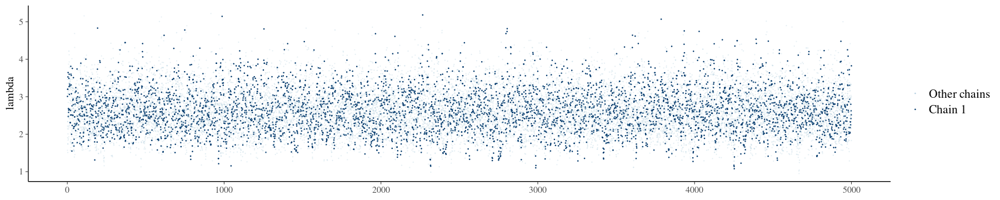

In [40]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=1)

Chain 2:

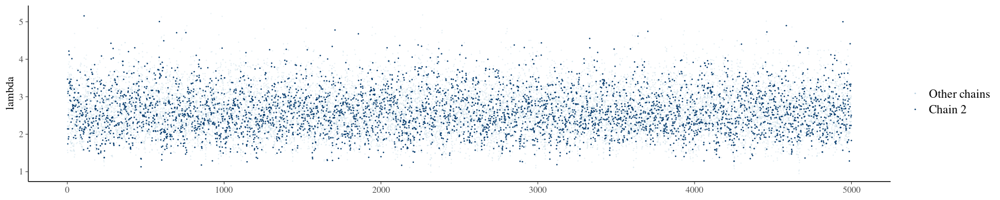

In [41]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=2)

Chain 3:

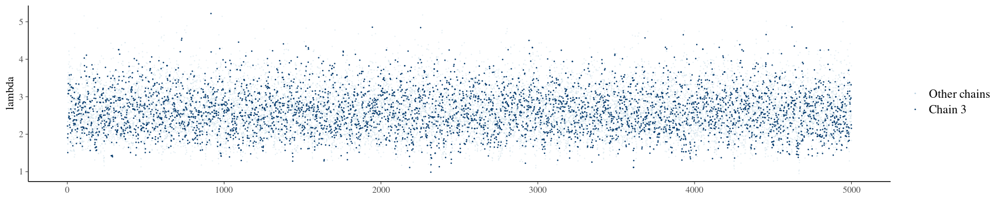

In [42]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=3)

Chain 4:

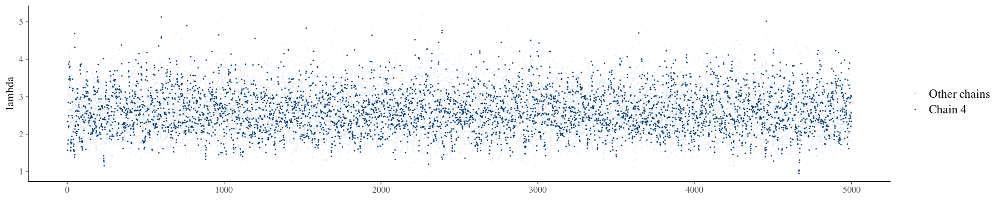

In [43]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=4)

#### Density plots for all four chains:

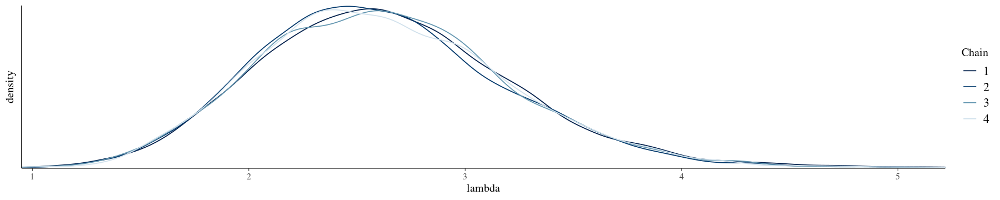

In [44]:
mcmc_dens_overlay(gp_sim, pars="lambda") +
    ylab("density")

More or less in agreement!

### c)

$\lambda \approx 2.5$ seams to be the most plausible value.

### d)

Actual posterior model: 

$\text{Gamma}(20,5) \to \text{Gamma}(20 + \sum_i y_i, 5 + n) = \text{Gamma(21, 8)}$

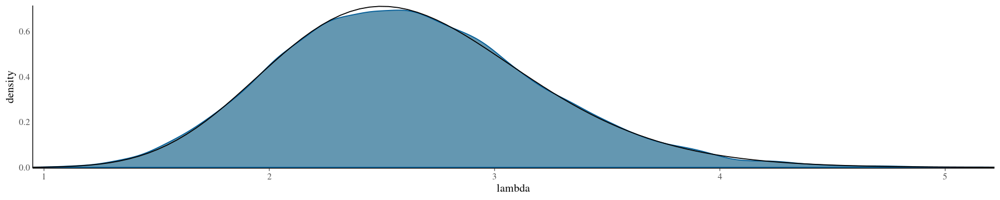

In [45]:
mcmc_dens( gp_sim, pars="lambda" ) +
    stat_function( fun = dgamma, args = list(21, 8) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!

## Exercise 6.16

### a)

In [46]:
gp_model <- "
    data {
        int<lower=0> Y[3];
    }
    parameters {
        real<lower=0> lambda;
    }
    model {
        Y ~ poisson(lambda);
        lambda ~ gamma(5,5);
    }
"

gp_sim <- stan(model_code=gp_model, data=list(Y = c(0,1,0)), chains=4, iter=10000, seed=84735)


SAMPLING FOR MODEL 'f3319d122e811833c2872d492877b856' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 6e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.06 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.014536 seconds (Warm-up)
Chain 1:                0.014631 seconds 

Chain 1:

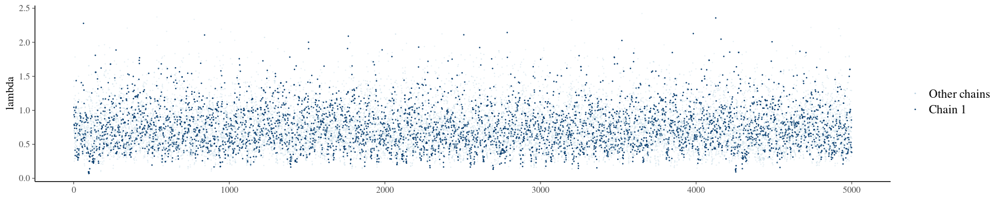

In [47]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=1)

Chain 2:

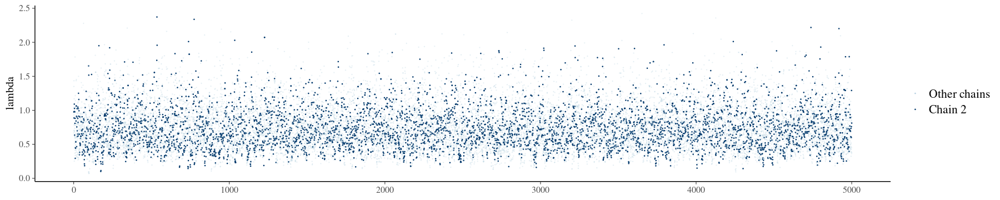

In [48]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=2)

Chain 3:

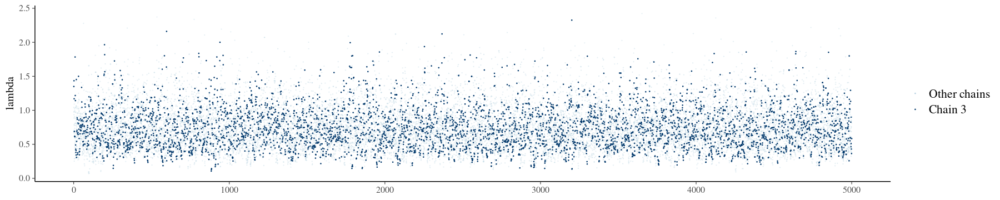

In [49]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=3)

Chain 4:

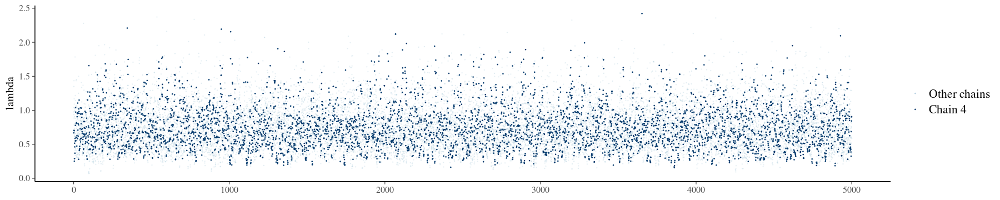

In [50]:
mcmc_trace_highlight(gp_sim, pars="lambda", size=0.1, highlight=4)

#### Density plots for all four chains:

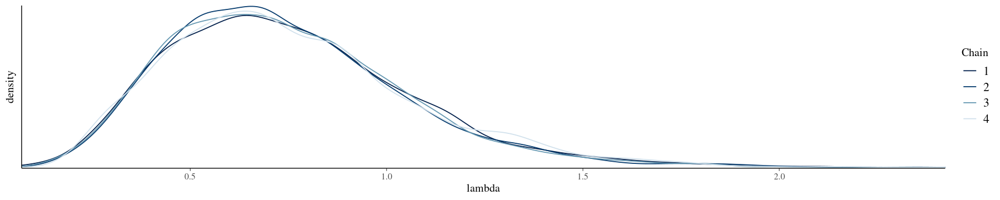

In [51]:
mcmc_dens_overlay(gp_sim, pars="lambda") +
    ylab("density")

More or less in agreement!

### c)

$\lambda \approx 0.6$ seams to be the most plausible value.

### d)

Actual posterior model: 

$\text{Gamma}(5,5) \to \text{Gamma}(5 + \sum_i y_i, 5 + n) = \text{Gamma(6, 8)}$

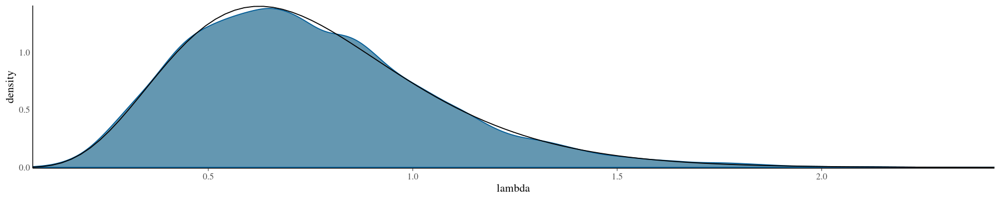

In [52]:
mcmc_dens( gp_sim, pars="lambda" ) +
    stat_function( fun = dgamma, args = list(6, 8) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!

## Exercise 6.17

### a)

In [53]:
nn_model <- "
    data {
        real Y[4];
    }
    parameters {
        real mu;
    }
    model {
        Y ~ normal(mu, 1.3);
        mu ~ normal(10, 1.2);
    }
"

nn_sim <- stan(model_code=nn_model, data=list(Y = c(7.1, 8.9, 8.4, 8.6)), chains=4, iter=10000, seed=84735)


SAMPLING FOR MODEL '31b8ffc4ca9fb8b545afa7964f5ee9f6' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 7e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.07 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.013684 seconds (Warm-up)
Chain 1:                0.013677 seconds 

Chain 1:

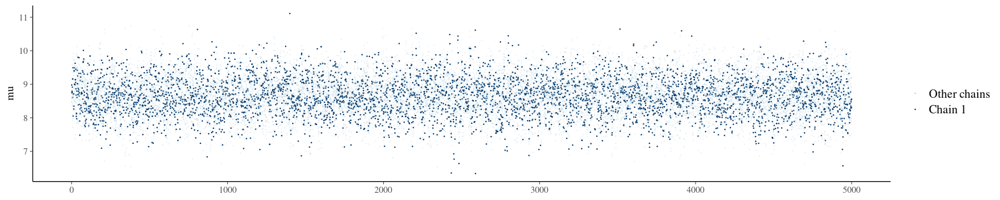

In [54]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=1)

Chain 2:

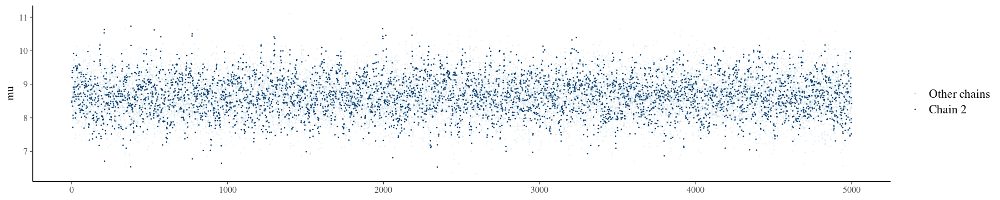

In [55]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=2)

Chain 3:

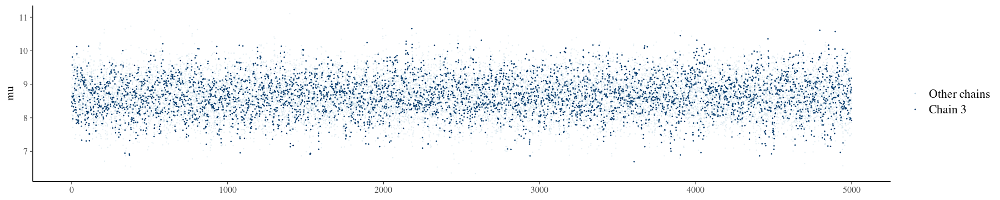

In [56]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=3)

Chain 4:

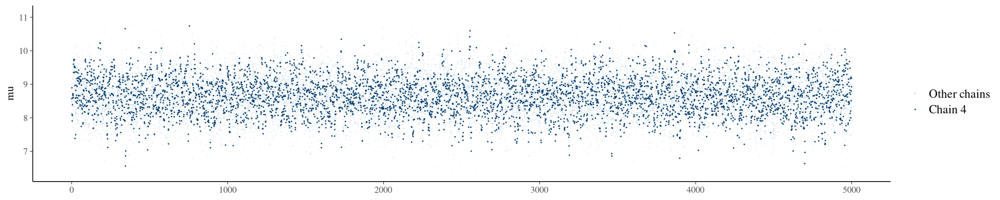

In [57]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=4)

#### Density plots for all four chains:

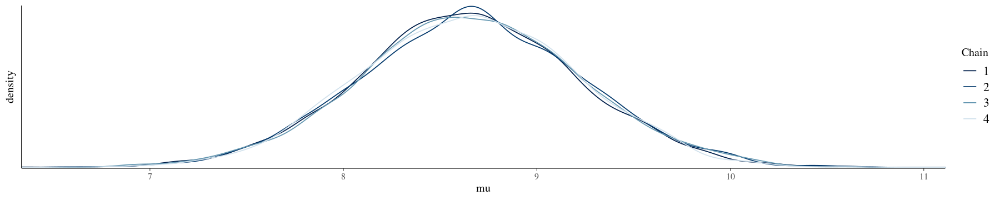

In [58]:
mcmc_dens_overlay(nn_sim, pars="mu") +
    ylab("density")

More or less in agreement!

### c)

$\lambda \approx 7.5$ seams to be the most plausible value.

### d)

Actual posterior model: 

(done previously - use directly the bayesrules function here)

In [59]:
posterior_parameters <- summarize_normal_normal(
        mean=10, sd=1.2, sigma=1.3, n=4, y_bar=mean(c(7.1, 8.9, 8.4, 8.6)) 
    ) %>% 
    filter( model=="posterior" )
posterior_parameters

model,mean,mode,var,sd
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
posterior,8.64698,8.64698,0.3266577,0.5715398


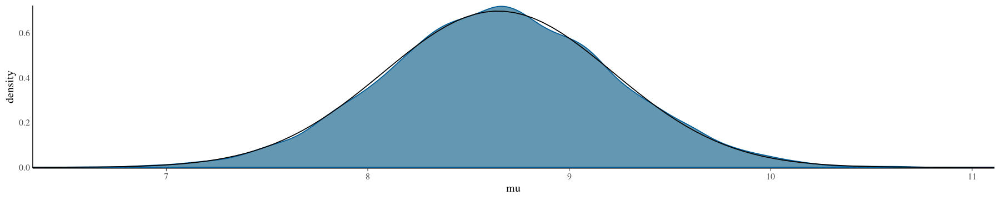

In [60]:
mcmc_dens( nn_sim, pars="mu" ) +
    stat_function( fun = dnorm, args = list(posterior_parameters$mean, posterior_parameters$sd) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!

## Exercise 6.18

### a)

In [61]:
nn_model <- "
    data {
        real Y[5];
    }
    parameters {
        real mu;
    }
    model {
        Y ~ normal(mu, 8);
        mu ~ normal(-14, 2);
    }
"

nn_sim <- stan(model_code=nn_model, data=list(Y = c(-10.1,5.5,0.1,-1.4,11.5)), chains=4, iter=10000, seed=84735)


SAMPLING FOR MODEL 'd25adbd4ce851ad770b801bbb406b7f9' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 6e-06 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.06 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 10000 [  0%]  (Warmup)
Chain 1: Iteration: 1000 / 10000 [ 10%]  (Warmup)
Chain 1: Iteration: 2000 / 10000 [ 20%]  (Warmup)
Chain 1: Iteration: 3000 / 10000 [ 30%]  (Warmup)
Chain 1: Iteration: 4000 / 10000 [ 40%]  (Warmup)
Chain 1: Iteration: 5000 / 10000 [ 50%]  (Warmup)
Chain 1: Iteration: 5001 / 10000 [ 50%]  (Sampling)
Chain 1: Iteration: 6000 / 10000 [ 60%]  (Sampling)
Chain 1: Iteration: 7000 / 10000 [ 70%]  (Sampling)
Chain 1: Iteration: 8000 / 10000 [ 80%]  (Sampling)
Chain 1: Iteration: 9000 / 10000 [ 90%]  (Sampling)
Chain 1: Iteration: 10000 / 10000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.01391 seconds (Warm-up)
Chain 1:                0.01413 seconds (S

Chain 1:

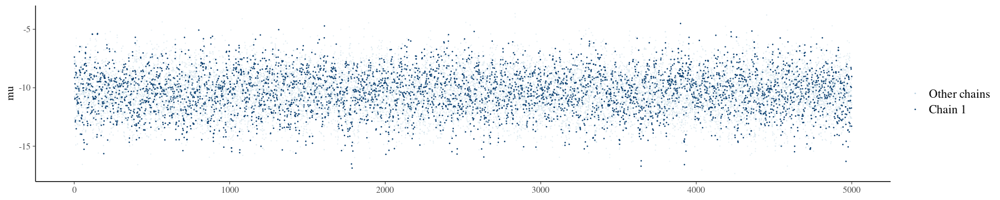

In [62]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=1)

Chain 2:

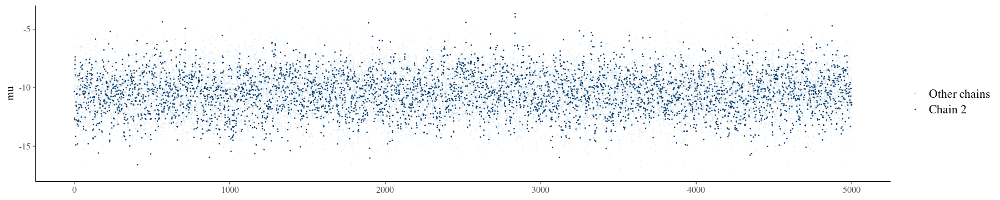

In [63]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=2)

Chain 3:

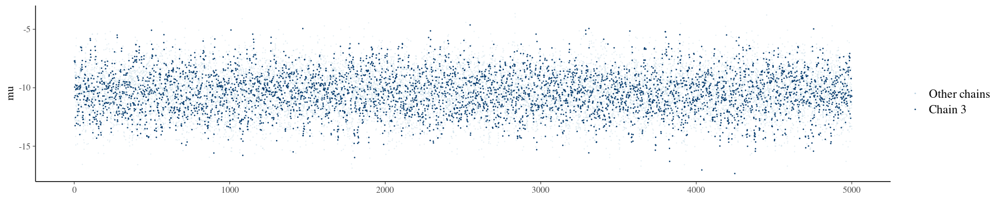

In [64]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=3)

Chain 4:

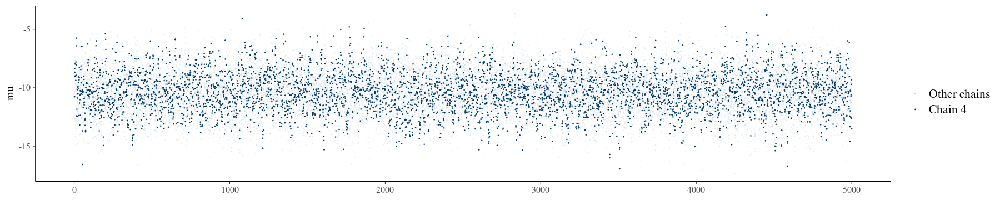

In [65]:
mcmc_trace_highlight(nn_sim, pars="mu", size=0.1, highlight=4)

#### Density plots for all four chains:

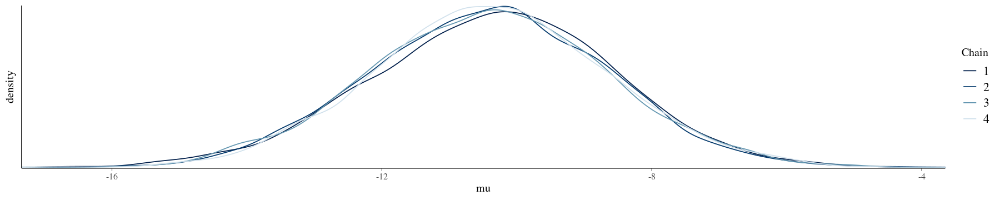

In [66]:
mcmc_dens_overlay(nn_sim, pars="mu") +
    ylab("density")

More or less in agreement!

### c)

$\lambda \approx -10.5$ seams to be the most plausible value.

### d)

Actual posterior model: 

(done previously - use directly the bayesrules function here)

In [67]:
posterior_parameters <- summarize_normal_normal(
        mean=-14, sd=2, sigma=8, n=5, y_bar=mean(c(-10.1,5.5,0.1,-1.4,11.5)) 
    ) %>% 
    filter( model=="posterior" )
posterior_parameters

model,mean,mode,var,sd
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
posterior,-10.4,-10.4,3.047619,1.745743


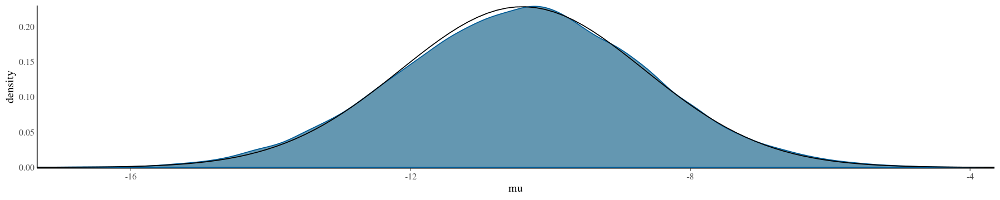

In [68]:
mcmc_dens( nn_sim, pars="mu" ) +
    stat_function( fun = dnorm, args = list(posterior_parameters$mean, posterior_parameters$sd) ) +
    yaxis_text(TRUE) +
    ylab("density")

Reasonable approximation!